# Oil and Gas Emission Tracking

The dataset is available on CSV format, we are going to analysis dataset using pandas data frame.

## Importing libraries

In [59]:
pip install --upgrade plotly


Note: you may need to restart the kernel to use updated packages.


In [60]:
import pandas as pd
import numpy as np

#Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as po
import plotly.graph_objs as pg

In [4]:
# change the decimal point for float in the dataset
pd.options.display.float_format = "{:.2f}".format

## Uploading the dataset

In [5]:
df1 = pd.read_csv("GCB2022v27_MtCO2_flat.csv")

In [6]:
df2 = pd.read_csv("GCB2022v27_percapita_flat.csv")

In [7]:
df3 = pd.read_csv("GCB2022v27_sources_flat.csv")

In [8]:
df1.head(5)

,Country,ISO 3166-1 alpha-3,Year,Total,Coal,Oil,Gas,Cement,Flaring,Other,Per Capita
0,Afghanistan,AFG,1750,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,AFG,1751,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,AFG,1752,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,AFG,1753,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,AFG,1754,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
df1.tail(5)

,Country,ISO 3166-1 alpha-3,Year,Total,Coal,Oil,Gas,Cement,Flaring,Other,Per Capita
63099,Global,WLD,2017,36096.74,14506.97,12242.63,7144.93,1507.92,391.99,302.29,4.75
63100,Global,WLD,2018,36826.51,14746.83,12266.02,7529.85,1569.22,412.12,302.48,4.79
63101,Global,WLD,2019,37082.56,14725.98,12345.65,7647.53,1617.51,439.25,306.64,4.78
63102,Global,WLD,2020,35264.09,14174.56,11191.81,7556.29,1637.54,407.58,296.30,4.50
63103,Global,WLD,2021,37123.85,14979.60,11837.16,7921.83,1672.59,416.53,296.15,4.69


## Data Preparation and Cleaning

In [61]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63104 entries, 0 to 63103
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Country             63104 non-null  object 
 1   ISO 3166-1 alpha-3  61472 non-null  object 
 2   Year                63104 non-null  int64  
 3   Total               62904 non-null  float64
 4   Coal                21744 non-null  float64
 5   Oil                 21717 non-null  float64
 6   Gas                 21618 non-null  float64
 7   Cement              20814 non-null  float64
 8   Flaring             21550 non-null  float64
 9   Other               1620 non-null   float64
 10  Per Capita          18974 non-null  float64
dtypes: float64(8), int64(1), object(2)
memory usage: 5.3+ MB


In [11]:
df1.shape

(63104, 11)

In [12]:
df1.index

RangeIndex(start=0, stop=63104, step=1)

In [13]:
df1.columns

Index(['Country', 'ISO 3166-1 alpha-3', 'Year', 'Total', 'Coal', 'Oil', 'Gas',
       'Cement', 'Flaring', 'Other', 'Per Capita'],
      dtype='object')

In [14]:
df1.dtypes

Country                object
ISO 3166-1 alpha-3     object
Year                    int64
Total                 float64
Coal                  float64
Oil                   float64
Gas                   float64
Cement                float64
Flaring               float64
Other                 float64
Per Capita            float64
dtype: object

In [15]:
df1.describe()

,Year,Total,Coal,Oil,Gas,Cement,Flaring,Other,Per Capita
count,63104.00,62904.00,21744.00,21717.00,21618.00,20814.00,21550.00,1620.00,18974.00
mean,1885.50,55.22,73.97,55.76,23.50,4.33,1.71,10.95,4.41
std,78.52,824.85,598.99,519.03,247.67,50.31,16.73,39.03,17.43
min,1750.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,1817.75,0.00,0.00,0.09,0.00,0.00,0.00,0.52,0.20
50%,1885.50,0.00,0.27,1.04,0.00,0.02,0.00,1.26,1.30
75%,1953.25,0.55,6.74,8.34,0.58,0.57,0.00,4.39,5.08
max,2021.00,37123.85,15051.51,12345.65,7921.83,1672.59,439.25,306.64,834.19


In [16]:
len(df1.Country.unique())

232

In [17]:
df1.nunique()

Country                 232
ISO 3166-1 alpha-3      225
Year                    272
Total                 16193
Coal                  10833
Oil                   11734
Gas                    6443
Cement                 9119
Flaring                3578
Other                  1519
Per Capita            17111
dtype: int64

In [18]:
df1.count()

Country               63104
ISO 3166-1 alpha-3    61472
Year                  63104
Total                 62904
Coal                  21744
Oil                   21717
Gas                   21618
Cement                20814
Flaring               21550
Other                  1620
Per Capita            18974
dtype: int64

In [19]:
df1.isnull().sum()

Country                   0
ISO 3166-1 alpha-3     1632
Year                      0
Total                   200
Coal                  41360
Oil                   41387
Gas                   41486
Cement                42290
Flaring               41554
Other                 61484
Per Capita            44130
dtype: int64

In [20]:
df1.isnull().sum().sort_values()

Country                   0
Year                      0
Total                   200
ISO 3166-1 alpha-3     1632
Coal                  41360
Oil                   41387
Gas                   41486
Flaring               41554
Cement                42290
Per Capita            44130
Other                 61484
dtype: int64

In [21]:
df1.Country.value_counts()

Afghanistan    272
Peru           272
Niger          272
Nigeria        272
Niue           272
              ... 
Greenland      272
Grenada        272
Guadeloupe     272
Guatemala      272
Global         272
Name: Country, Length: 232, dtype: int64

In [22]:
df2.head(5)

,Country,ISO 3166-1 alpha-3,Year,Total,Coal,Oil,Gas,Cement,Flaring,Other
0,Afghanistan,AFG,1750,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,AFG,1751,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,AFG,1752,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,AFG,1753,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,AFG,1754,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
df2.tail(5)

,Country,ISO 3166-1 alpha-3,Year,Total,Coal,Oil,Gas,Cement,Flaring,Other
63099,Global,WLD,2017,4.75,1.91,1.61,0.94,0.20,0.05,0.04
63100,Global,WLD,2018,4.79,1.92,1.60,0.98,0.20,0.05,0.04
63101,Global,WLD,2019,4.78,1.90,1.59,0.98,0.21,0.06,0.04
63102,Global,WLD,2020,4.50,1.81,1.43,0.96,0.21,0.05,0.04
63103,Global,WLD,2021,4.69,1.89,1.50,1.00,0.21,0.05,0.04


In [24]:
df2.dtypes

Country                object
ISO 3166-1 alpha-3     object
Year                    int64
Total                 float64
Coal                  float64
Oil                   float64
Gas                   float64
Cement                float64
Flaring               float64
Other                 float64
dtype: object

In [25]:
df2.shape

(63104, 10)

In [26]:
df2.isnull().sum().sort_values()

Country                   0
Year                      0
ISO 3166-1 alpha-3     1632
Total                 44132
Coal                  45966
Oil                   46065
Gas                   46092
Flaring               46160
Cement                47656
Other                 61484
dtype: int64

In [27]:
df3.head(5)

,Country,ISO 3166-1 alpha-3,Year,Total,Coal,Oil,Gas,Cement,Flaring,Other,Per Capita
0,Afghanistan,AFG,1750,[NONE],[NONE],[NONE],[NONE],[NONE],[NONE],[NONE],[NONE]
1,Afghanistan,AFG,1751,[NONE],[NONE],[NONE],[NONE],[NONE],[NONE],[NONE],[NONE]
2,Afghanistan,AFG,1752,[NONE],[NONE],[NONE],[NONE],[NONE],[NONE],[NONE],[NONE]
3,Afghanistan,AFG,1753,[NONE],[NONE],[NONE],[NONE],[NONE],[NONE],[NONE],[NONE]
4,Afghanistan,AFG,1754,[NONE],[NONE],[NONE],[NONE],[NONE],[NONE],[NONE],[NONE]


In [28]:
df3.tail(4)

,Country,ISO 3166-1 alpha-3,Year,Total,Coal,Oil,Gas,Cement,Flaring,Other,Per Capita
63100,Global,WLD,2018,"CDIAC 2022, BP, and Sum of countries",CDIAC 2022 and BP,CDIAC 2022 and BP,CDIAC 2022 and BP,Andrew cement,CDIAC 2022 and GCP,[NONE],"CDIAC 2022, BP, Sum of countries, and UN popul..."
63101,Global,WLD,2019,"CDIAC 2022, BP, and Sum of countries",CDIAC 2022 and BP,CDIAC 2022 and BP,CDIAC 2022 and BP,Andrew cement,CDIAC 2022 and GCP,[NONE],"CDIAC 2022, BP, Sum of countries, and UN popul..."
63102,Global,WLD,2020,"CDIAC 2022, BP, and Sum of countries",CDIAC 2022 and BP,CDIAC 2022 and BP,CDIAC 2022 and BP,Andrew cement,CDIAC 2022 and GCP,[NONE],"CDIAC 2022, BP, Sum of countries, and UN popul..."
63103,Global,WLD,2021,"CDIAC 2022, BP, and Sum of countries",CDIAC 2022 and BP,CDIAC 2022 and BP,CDIAC 2022 and BP,Andrew cement,CDIAC 2022 and GCP,[NONE],"CDIAC 2022, BP, Sum of countries, and UN popul..."


In [29]:
df3.dtypes

Country               object
ISO 3166-1 alpha-3    object
Year                   int64
Total                 object
Coal                  object
Oil                   object
Gas                   object
Cement                object
Flaring               object
Other                 object
Per Capita            object
dtype: object

In [30]:
df3.shape

(63104, 11)

In [31]:
df3.isnull().sum().sort_values()

Country                  0
Year                     0
Total                    0
Coal                     0
Oil                      0
Gas                      0
Cement                   0
Flaring                  0
Other                    0
Per Capita               0
ISO 3166-1 alpha-3    1632
dtype: int64

## Data inspection

In [32]:
co2 = df1.copy()
co2.head(5)

,Country,ISO 3166-1 alpha-3,Year,Total,Coal,Oil,Gas,Cement,Flaring,Other,Per Capita
0,Afghanistan,AFG,1750,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,AFG,1751,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,AFG,1752,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,AFG,1753,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,AFG,1754,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [33]:
# Replace the NaN value with 0
co2 = df1.fillna(0)
co2.head(2)

,Country,ISO 3166-1 alpha-3,Year,Total,Coal,Oil,Gas,Cement,Flaring,Other,Per Capita
0,Afghanistan,AFG,1750,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,Afghanistan,AFG,1751,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [34]:
co2.Year.unique()

array([1750, 1751, 1752, 1753, 1754, 1755, 1756, 1757, 1758, 1759, 1760,
       1761, 1762, 1763, 1764, 1765, 1766, 1767, 1768, 1769, 1770, 1771,
       1772, 1773, 1774, 1775, 1776, 1777, 1778, 1779, 1780, 1781, 1782,
       1783, 1784, 1785, 1786, 1787, 1788, 1789, 1790, 1791, 1792, 1793,
       1794, 1795, 1796, 1797, 1798, 1799, 1800, 1801, 1802, 1803, 1804,
       1805, 1806, 1807, 1808, 1809, 1810, 1811, 1812, 1813, 1814, 1815,
       1816, 1817, 1818, 1819, 1820, 1821, 1822, 1823, 1824, 1825, 1826,
       1827, 1828, 1829, 1830, 1831, 1832, 1833, 1834, 1835, 1836, 1837,
       1838, 1839, 1840, 1841, 1842, 1843, 1844, 1845, 1846, 1847, 1848,
       1849, 1850, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859,
       1860, 1861, 1862, 1863, 1864, 1865, 1866, 1867, 1868, 1869, 1870,
       1871, 1872, 1873, 1874, 1875, 1876, 1877, 1878, 1879, 1880, 1881,
       1882, 1883, 1884, 1885, 1886, 1887, 1888, 1889, 1890, 1891, 1892,
       1893, 1894, 1895, 1896, 1897, 1898, 1899, 19

In [35]:
co2.Year.nunique()

272

In [36]:
co2 = co2[co2['Country'] != 'Global']
co2

,Country,ISO 3166-1 alpha-3,Year,Total,Coal,Oil,Gas,Cement,Flaring,Other,Per Capita
0,Afghanistan,AFG,1750,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,Afghanistan,AFG,1751,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,Afghanistan,AFG,1752,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,Afghanistan,AFG,1753,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4,Afghanistan,AFG,1754,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...
62827,International Transport,XIT,2017,1230.51,0.00,1230.51,0.00,0.00,0.00,0.00,0.00
62828,International Transport,XIT,2018,1270.69,0.00,1270.69,0.00,0.00,0.00,0.00,0.00
62829,International Transport,XIT,2019,1249.56,0.00,1249.56,0.00,0.00,0.00,0.00,0.00
62830,International Transport,XIT,2020,938.51,0.00,938.51,0.00,0.00,0.00,0.00,0.00


In [37]:
df = co2[['Country' , 'Year' , 'Total']]
df

,Country,Year,Total
0,Afghanistan,1750,0.00
1,Afghanistan,1751,0.00
2,Afghanistan,1752,0.00
3,Afghanistan,1753,0.00
4,Afghanistan,1754,0.00
...,...,...,...
62827,International Transport,2017,1230.51
62828,International Transport,2018,1270.69
62829,International Transport,2019,1249.56
62830,International Transport,2020,938.51


In [38]:
result_df = df.groupby(['Country']).Total.sum().sort_values(ascending=False)[:10]
result_df

Country
USA                       421906.86
China                     249352.82
Russia                    117547.63
Germany                    93290.50
United Kingdom             78508.72
Japan                      66711.08
India                      57105.39
International Transport    43062.67
France                     39105.76
Canada                     34115.40
Name: Total, dtype: float64

## Exploratory Data Analysis

In [39]:
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

sns.set_style('white')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (12, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

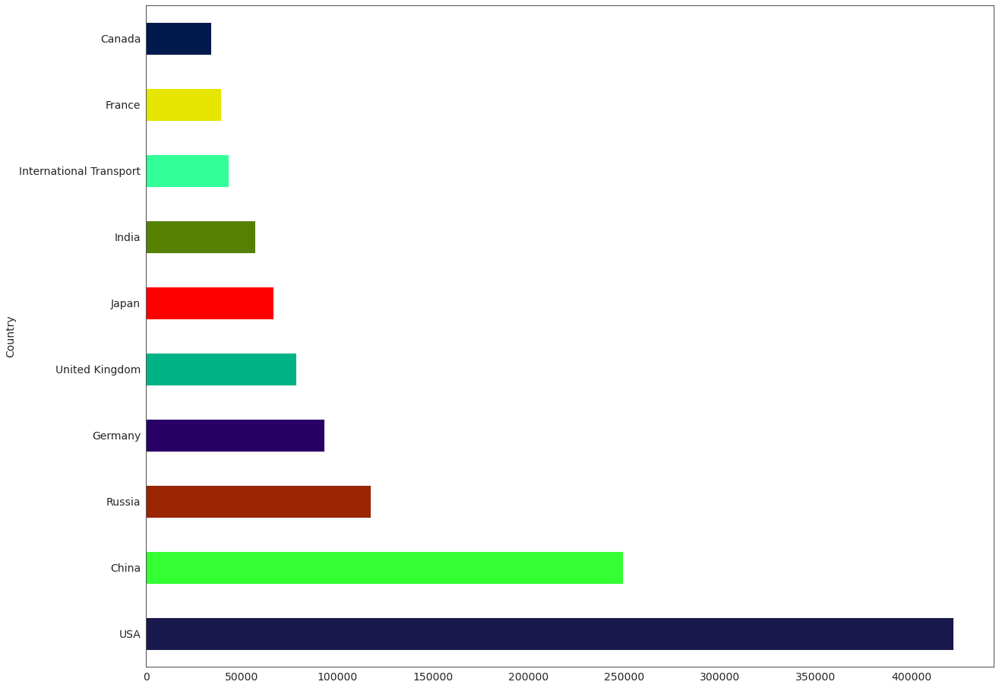

In [40]:
# Assuming you have already defined the result_df DataFrame and colors list
plt.figure(figsize=(20, 16))
colors = ['#19194d', '#33ff33', '#992600', '#290066', '#00b386', '#ff0000', '#558000', '#33ff99', '#e6e600', '#001a4d']
x = result_df.plot(kind='barh', color=colors)
plt.show()

In [41]:
result_df2 = df.groupby(['Country']).Total.sum().sort_values(ascending=False).tail(10)
result_df2

Country
Montserrat                  1.61
Christmas Island            1.33
Wallis and Futuna Islands   0.77
St. Kitts-Nevis-Anguilla    0.62
Saint Helena                0.40
Niue                        0.30
Tuvalu                      0.29
Puerto Rico                 0.21
Leeward Islands             0.18
Antarctica                  0.15
Name: Total, dtype: float64

In [42]:
India = df.query("Country == 'India'")
India

,Country,Year,Total
25296,India,1750,0.00
25297,India,1751,0.00
25298,India,1752,0.00
25299,India,1753,0.00
25300,India,1754,0.00
...,...,...,...
25563,India,2017,2434.87
25564,India,2018,2600.45
25565,India,2019,2626.46
25566,India,2020,2445.01


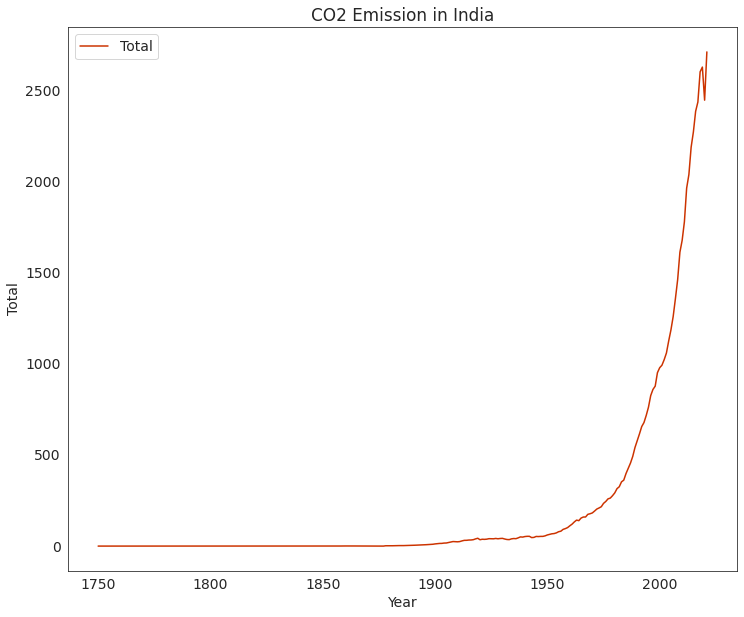

In [43]:
# Line plot
colors = '#cc3300'
ax = India.plot(x = 'Year' , y = 'Total' , figsize = (12,10) , color = colors)
plt.xlabel('Year')
plt.ylabel('Total')
plt.title('CO2 Emission in India');

In [44]:
nigeria = df.query("Country == 'Nigeria'")
nigeria

,Country,Year,Total
40256,Nigeria,1750,0.00
40257,Nigeria,1751,0.00
40258,Nigeria,1752,0.00
40259,Nigeria,1753,0.00
40260,Nigeria,1754,0.00
...,...,...,...
40523,Nigeria,2017,112.78
40524,Nigeria,2018,105.23
40525,Nigeria,2019,127.30
40526,Nigeria,2020,130.18


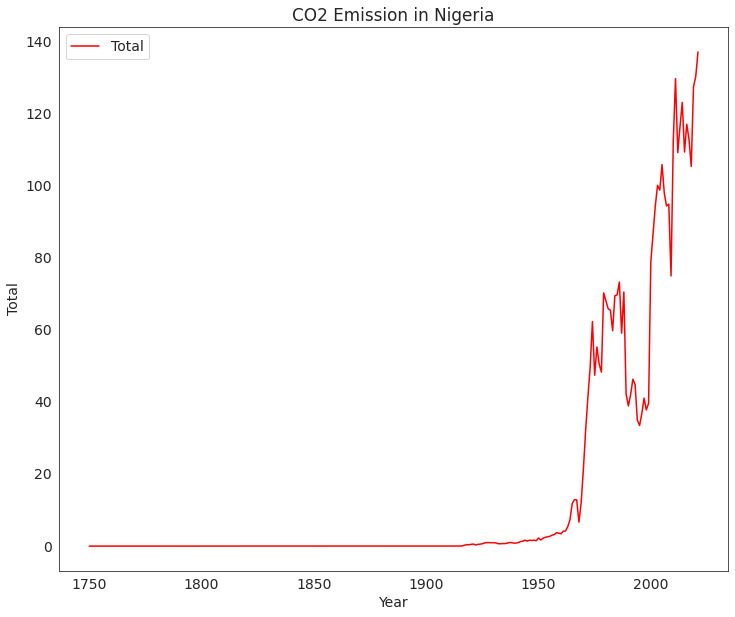

In [45]:
# Line plot
colors = 'red'
ax = nigeria.plot(x = 'Year' , y = 'Total' , figsize = (12,10) , color = colors)
x.set_xlabel('Year')
plt.ylabel('Total')
plt.title('CO2 Emission in Nigeria');

In [46]:
USA = df.query("Country == 'USA'")
USA

,Country,Year,Total
59840,USA,1750,0.00
59841,USA,1751,0.00
59842,USA,1752,0.00
59843,USA,1753,0.00
59844,USA,1754,0.00
...,...,...,...
60107,USA,2017,5210.96
60108,USA,2018,5376.66
60109,USA,2019,5259.14
60110,USA,2020,4715.69


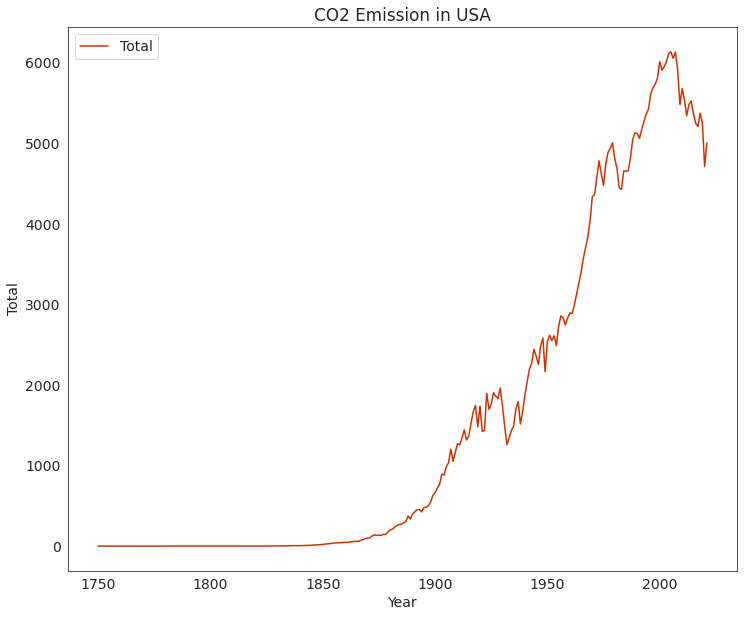

In [47]:
# Assuming you have already defined the result_df DataFrame and colors list
# Line plot
colors = '#cc3300'
ax = USA.plot(x = 'Year' , y = 'Total' , figsize = (12,10) , color = colors)
plt.xlabel('Year')
plt.ylabel('Total')
plt.title('CO2 Emission in USA');

In [48]:
China = df.query("Country == 'China'")
China

,Country,Year,Total
10608,China,1750,0.00
10609,China,1751,0.00
10610,China,1752,0.00
10611,China,1753,0.00
10612,China,1754,0.00
...,...,...,...
10875,China,2017,10011.11
10876,China,2018,10353.88
10877,China,2019,10741.00
10878,China,2020,10956.21


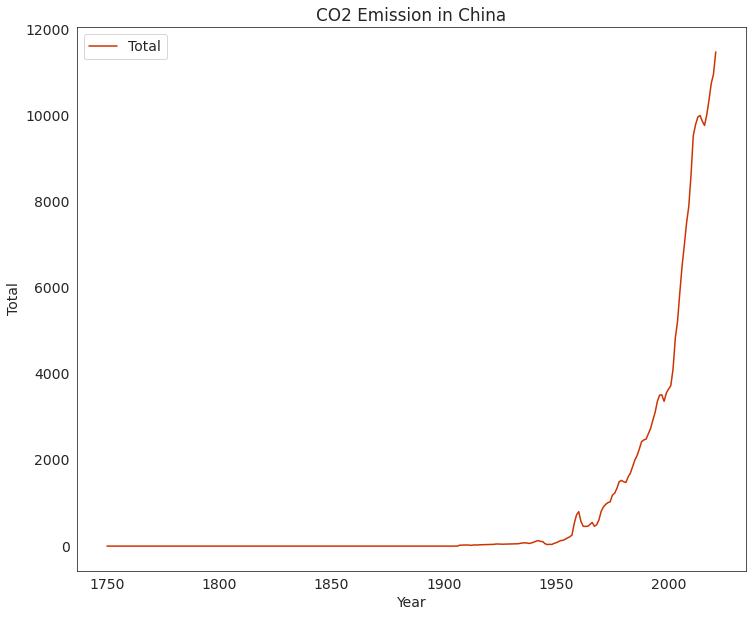

In [49]:
colors = '#cc3300'
ax = China.plot(x = 'Year' , y = 'Total' , figsize = (12,10) , color = colors)
plt.xlabel('Year')
plt.ylabel('Total')
plt.title('CO2 Emission in China');

In [50]:
dff = co2.copy()

In [51]:
dff

,Country,ISO 3166-1 alpha-3,Year,Total,Coal,Oil,Gas,Cement,Flaring,Other,Per Capita
0,Afghanistan,AFG,1750,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,Afghanistan,AFG,1751,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,Afghanistan,AFG,1752,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,Afghanistan,AFG,1753,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4,Afghanistan,AFG,1754,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...
62827,International Transport,XIT,2017,1230.51,0.00,1230.51,0.00,0.00,0.00,0.00,0.00
62828,International Transport,XIT,2018,1270.69,0.00,1270.69,0.00,0.00,0.00,0.00,0.00
62829,International Transport,XIT,2019,1249.56,0.00,1249.56,0.00,0.00,0.00,0.00,0.00
62830,International Transport,XIT,2020,938.51,0.00,938.51,0.00,0.00,0.00,0.00,0.00


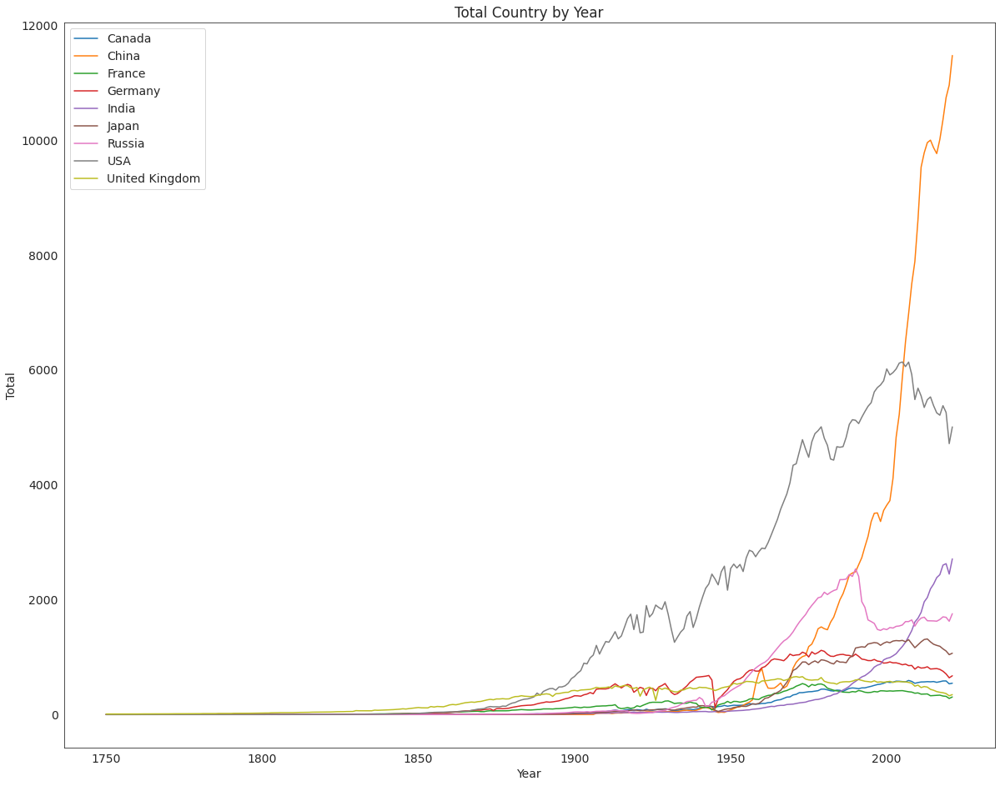

In [52]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 16))

Country_list = dff[dff['Country'].isin(['USA', 'China', 'Russia', 'Germany', 'United Kingdom', 'Japan',  'India', 'France', 'Canada'])]
grouped = Country_list.groupby('Country')

for name, group in grouped:
    plt.plot(group['Year'], group['Total'], label=name)

plt.title('Total Country by Year')    
plt.xlabel('Year')
plt.ylabel('Total')
plt.legend()
plt.show()

## Emission of Oil

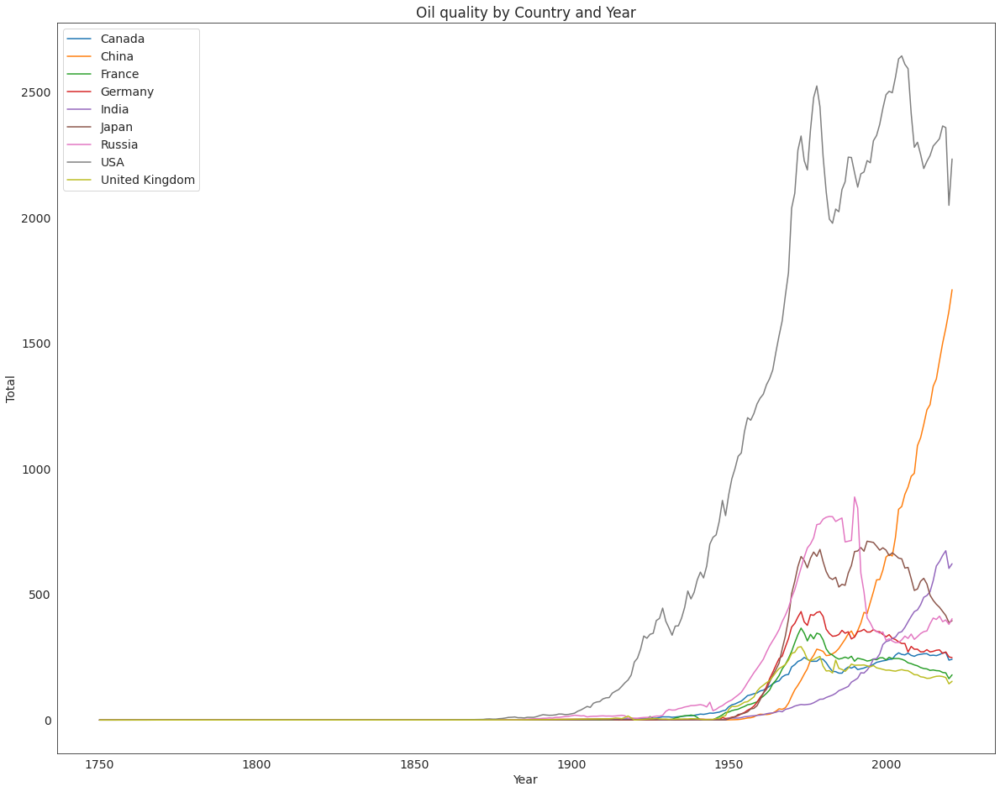

In [53]:
plt.figure(figsize=(20, 16))

Country_list = dff[dff['Country'].isin(['USA', 'China', 'Russia', 'Germany', 'United Kingdom', 'Japan',  'India', 'France', 'Canada'])]
grouped = Country_list.groupby('Country')

for name, group in grouped:
    plt.plot(group['Year'], group['Oil'], label=name)

plt.title('Oil quality by Country and Year')    
plt.xlabel('Year')
plt.ylabel('Total')
plt.legend()
plt.show()


## Emissions From gas

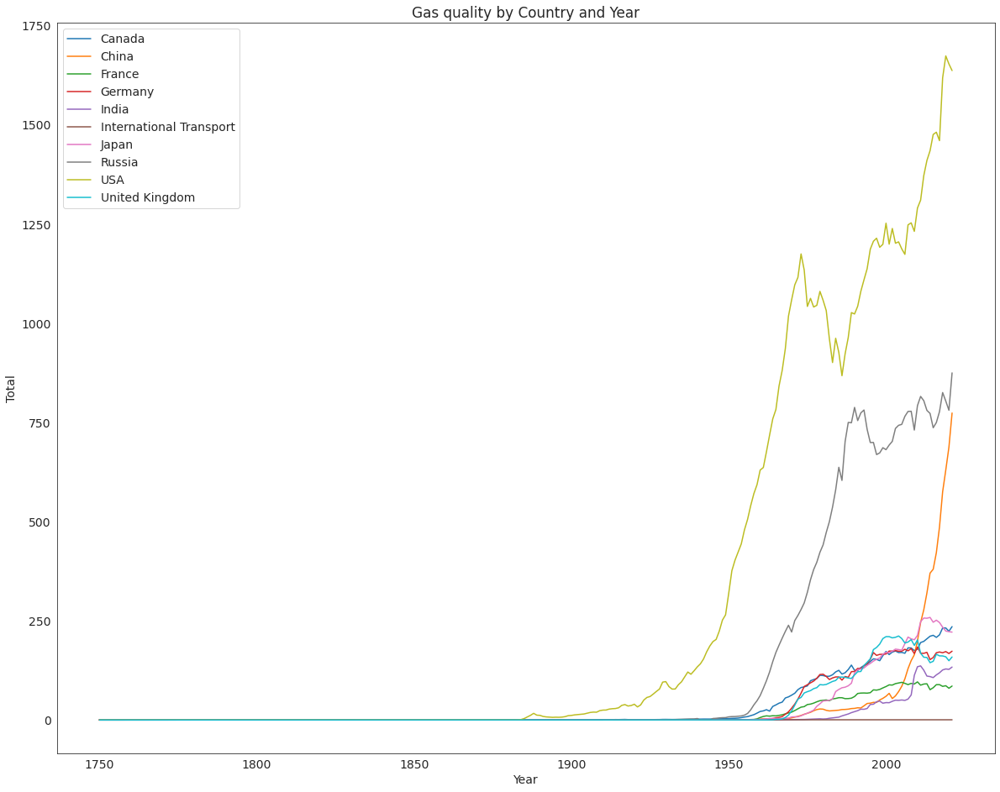

In [54]:
plt.figure(figsize=(20, 16))

Country_list = dff[dff['Country'].isin(['USA', 'China', 'Russia', 'Germany', 'United Kingdom', 'International Transport','Japan',  'India', 'France', 'Canada'])]
grouped = Country_list.groupby('Country')

for name, group in grouped:
    plt.plot(group['Year'], group['Gas'], label=name)

plt.title('Gas quality by Country and Year')    
plt.xlabel('Year')
plt.ylabel('Total')
plt.legend()
plt.show()

## EDA Summary

The Horizontal bar chat shows a visualization of the USA being the Country with the highest emission rate followed by china (in terms of cumulative emission).

International Transport shows zero emission rate.

The USA also leads in the summed amount of emission for Oil and Gas.

As compared to other 10 country , Nigeria has the least oil emission plot.

China has the highest  yearly total emission from about the year 2000.


## Per Capita modelling

In [63]:
import plotly.express as px

In [64]:
data = dff[['Country', 'Oil','Gas']]

# Create a DataFrame
world = pd.DataFrame(data)

# Create the choropleth plot
fig = px.choropleth(world, locations="Country",
                    hover_name="Country",
                    hover_data=world.columns,
                    color="Oil",
                    projection="natural earth",
                    title='choropleth Map showing World Population in 2022')
                

# Show the plot 
fig.show()